# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

## Get Our Workspace Ready

* Import TensorFlow 2.17.0
* Import TensorFlow Hub
* Make sure we're using a GPU

In [1]:
# Import necessary tools
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available!")

TF version: 2.17.0
TF Hub version: 0.16.1
GPU not available!


## Getting Our Data Ready (Turning Into Tensors)

With all machine learning models, our data has to be in numerical format. Hence, we will first turn our images into Tensors (numerical representations).

In [2]:
# Checkout the labels of our data
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/dog-breed-identification/labels.csv")

# See if our data makes sense
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


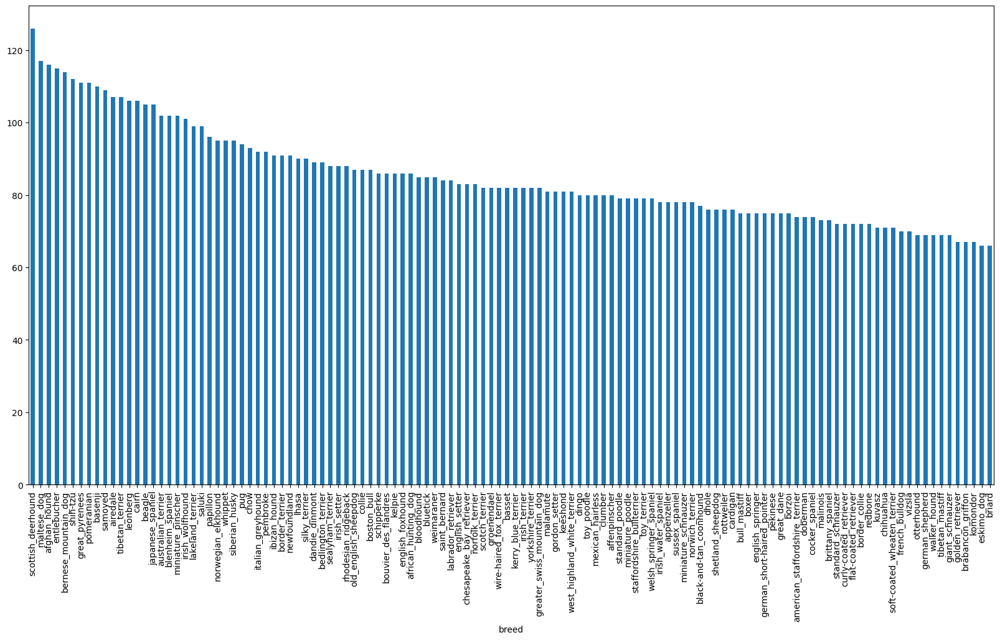

In [3]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))
plt.show()

In [4]:
# Check the median of our dataset
labels_csv["breed"].value_counts().median()

82.0

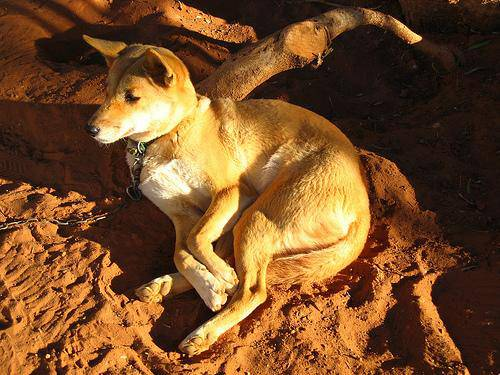

In [5]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images And Their Labels

Let's get a list of all of our image file pathnames.

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("Filenames match actual amount of files! Please proceed.")
else:
  print("Filenames do not match actual amount of files! Please check the relevant directory.")

Filenames match actual amount of files! Please proceed.


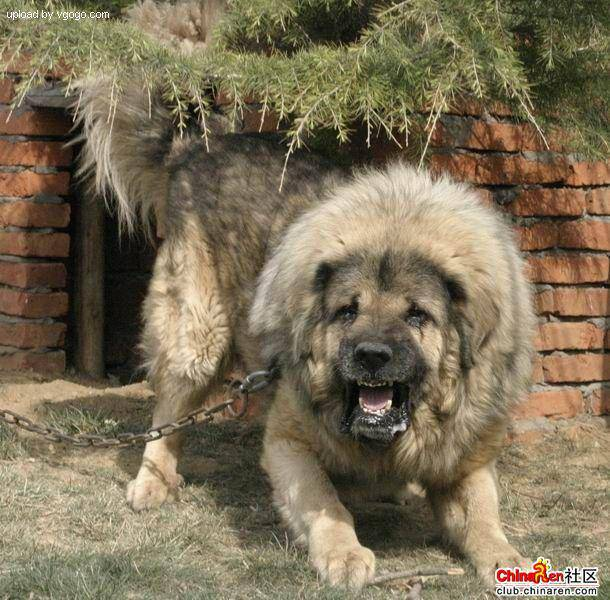

In [9]:
# One more check
Image(filenames[9000])

In [10]:
# Check the corresponding breed
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [11]:
# Convert our labels into numpy array
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
# Check the length of the array
len(labels)

10222

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames! Please proceed.")
else:
  print("Number of labels does not match number of filenames! Please check the relevant directories.")

Number of labels matches number of filenames! Please proceed.


In [14]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
# Look at all the unique breeds
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
# Check the length of boolean_labels
len(boolean_labels)

10222

In [19]:
# Examples: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
# Try another example
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Our Own Validation Set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [21]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [22]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [23]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Set random seed
np.random.seed(42)

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

# Check length of data
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [24]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,


### Preprocessing Images (Turning Images Into Tensors)

To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like.

In [25]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[66])
image.shape

(375, 500, 3)

array([[[102,  82,  47],
        [102,  82,  45],
        [121,  98,  57],
        ...,
        [251, 255, 236],
        [249, 254, 234],
        [249, 254, 234]],

       [[192, 169, 135],
        [219, 197, 160],
        [195, 172, 130],
        ...,
        [251, 255, 241],
        [250, 254, 240],
        [250, 254, 240]],

       [[249, 223, 190],
        [234, 208, 171],
        [190, 163, 116],
        ...,
        [253, 253, 251],
        [254, 254, 252],
        [254, 254, 252]],

       ...,

       [[ 78,  58,  57],
        [ 68,  49,  43],
        [ 79,  62,  52],
        ...,
        [ 97,  80,  62],
        [100,  83,  65],
        [104,  87,  69]],

       [[ 66,  46,  45],
        [ 54,  35,  29],
        [ 64,  47,  37],
        ...,
        [109,  92,  74],
        [115,  98,  80],
        [113,  96,  78]],

       [[ 46,  26,  25],
        [ 43,  24,  18],
        [ 61,  44,  34],
        ...,
        [134, 117,  99],
        [125, 108,  90],
        [113,  96,  78]]], dtype=uint8)
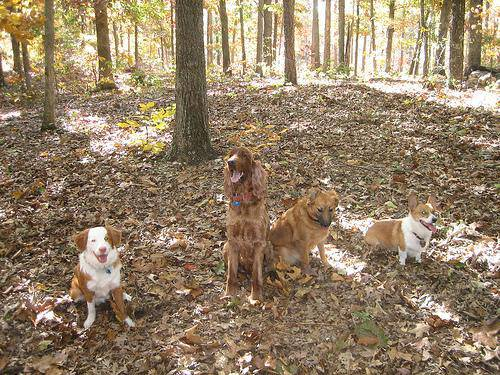

In [26]:
# Let's see what our array looks like
image

In [27]:
# max and min of RGB
image.max(), image.min()

(255, 0)

In [28]:
# First two arrays of image
image[:2]

array([[[102,  82,  47],
        [102,  82,  45],
        [121,  98,  57],
        ...,
        [251, 255, 236],
        [249, 254, 234],
        [249, 254, 234]],

       [[192, 169, 135],
        [219, 197, 160],
        [195, 172, 130],
        ...,
        [251, 255, 241],
        [250, 254, 240],
        [250, 254, 240]]], dtype=uint8)

In [29]:
# Convert image into a tensor and show their difference (compare to the previous cell)
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[102,  82,  47],
        [102,  82,  45],
        [121,  98,  57],
        ...,
        [251, 255, 236],
        [249, 254, 234],
        [249, 254, 234]],

       [[192, 169, 135],
        [219, 197, 160],
        [195, 172, 130],
        ...,
        [251, 255, 241],
        [250, 254, 240],
        [250, 254, 240]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert colour channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified image

In [30]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning Our Data Into Batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go, they might not all fit into memory.

That's why we do about 32 (batch size) images at a time (can manually adjust the batch size if needed).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [31]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [32]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`. Let's make a function to turn all of our data `(X, y)` into batches.

In [33]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have label
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a training dataset, we need to shuffle it
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [34]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend. Hence, let's visualize them.

In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

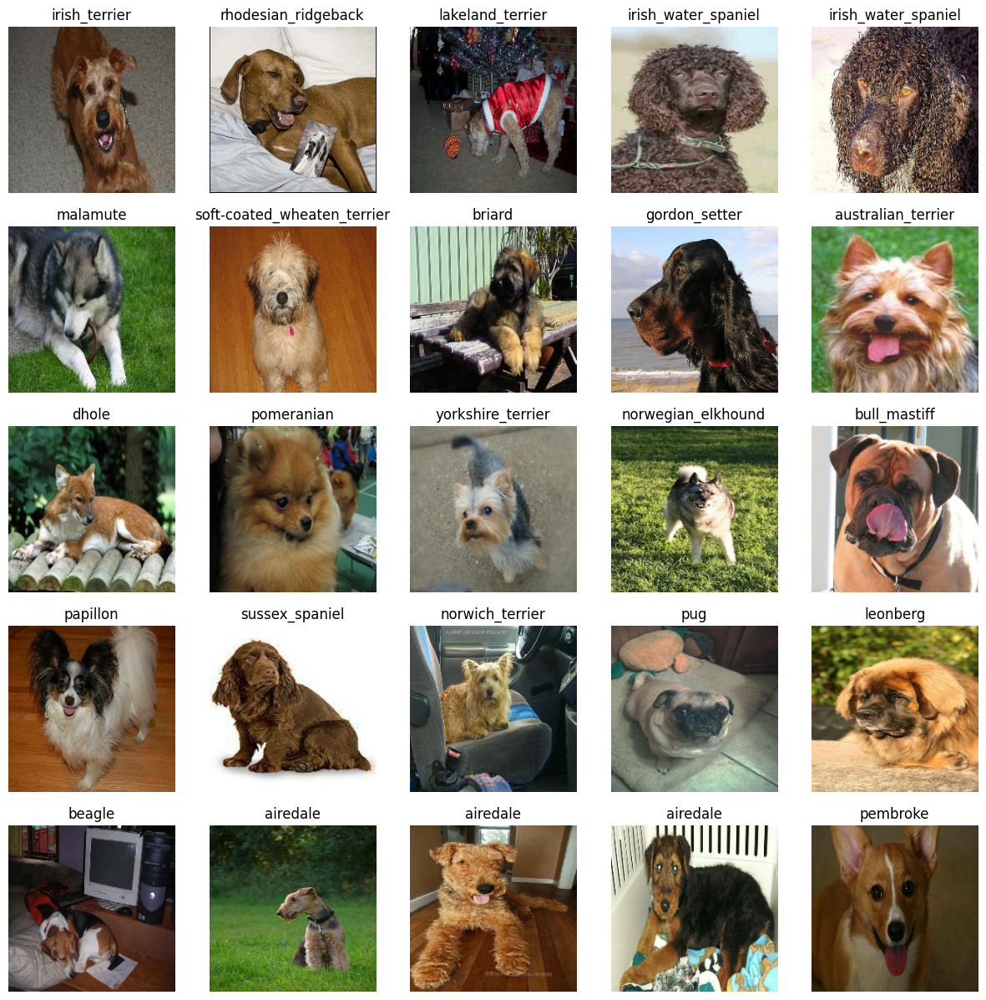

In [37]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

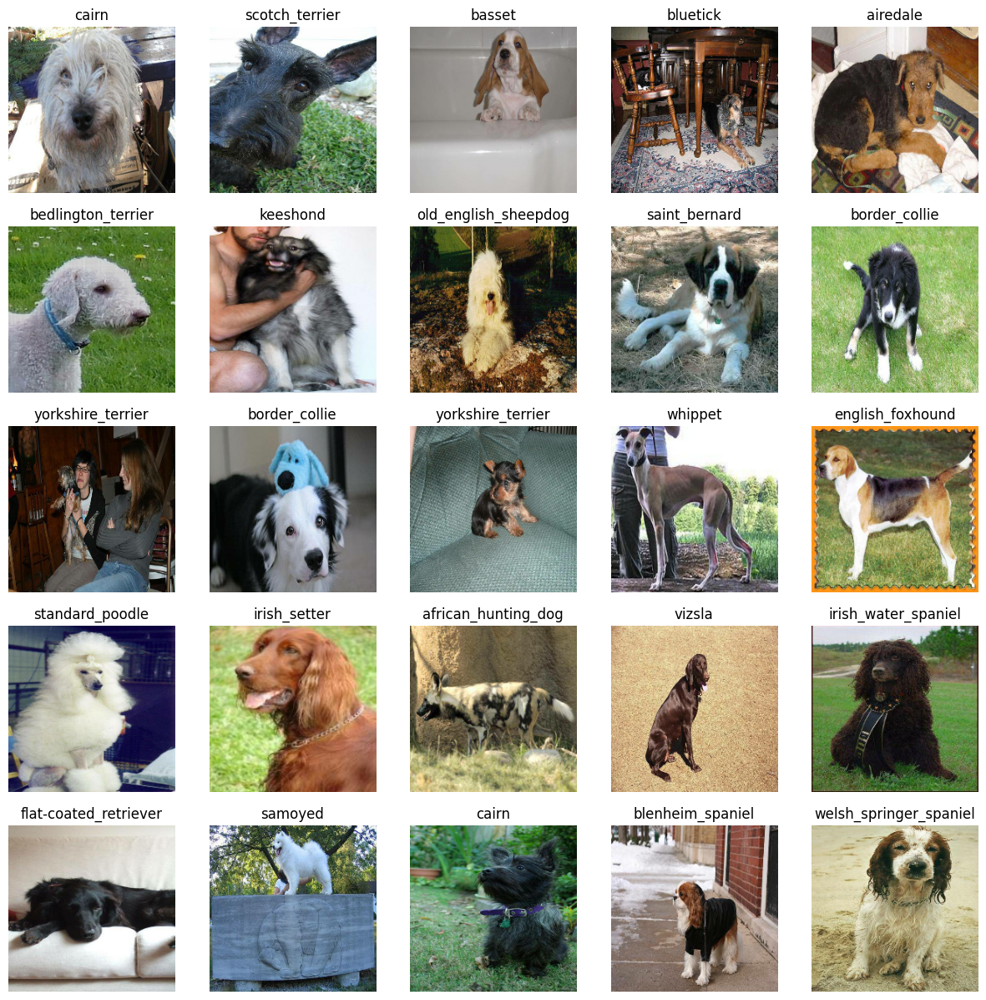

In [38]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building A Model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2

In [39]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

# Import keras
import tf_keras

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model.

Knowing this, let's create a function which:
* Takes this input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [40]:
# Create a functon which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  Builds a Keras model.
  """
  print("Building model with", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the mode
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [41]:
# Summarizing our model
model = create_model()
model.summary()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

#### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [42]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metris stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [44]:
# Creating early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Training A Model (On Subset Of Data)

Our first model is only going to train on 1000 images, to make sure everthing is working.

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [46]:
# Check to make sure we're still running on a GPU
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available!")

GPU not available!


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [47]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [49]:
# Fit the model to the data
model = train_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 73s 3s/step - loss: 4.7213 - accuracy: 0.0763 - val_loss: 3.5959 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 82s 3s/step - loss: 1.7045 - accuracy: 0.6900 - val_loss: 2.2643 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 68s 3s/step - loss: 0.5879 - accuracy: 0.9312 - val_loss: 1.7606 - val_accuracy: 0.5450
Epoch 4/100
25/25 [==============================] - 78s 3s/step - loss: 0.2633 - accuracy: 0.9850 - val_loss: 1.5462 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 77s 3s/step - loss: 0.1464 - accuracy: 0.9975 - val_loss: 1.4631 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 76s 3s/step - loss: 0.1023 - accuracy: 1.0000 - val_loss: 1.4204 - val_accuracy: 0.6100
Epoch 7/100
25/25 [============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing. It means our model is learning.

### Checking The TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [50]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/dog-breed-identification/logs

<IPython.core.display.Javascript object>

## Making And Evaluating Predictions Using A Trained Model

In [51]:
# Remind ourselves of our validation dataset
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [52]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 16s 2s/step


array([[5.22090588e-04, 2.44766852e-04, 2.32819730e-04, ...,
        2.05827469e-04, 1.63888981e-05, 5.97117143e-03],
       [1.99571829e-02, 6.42026251e-04, 6.41999394e-02, ...,
        1.70303378e-04, 1.66654703e-03, 4.98688372e-04],
       [3.65677693e-07, 1.30688168e-05, 8.77275852e-06, ...,
        1.00163970e-05, 1.81749158e-06, 6.57668934e-05],
       ...,
       [5.84001214e-07, 1.10190531e-05, 1.34977745e-05, ...,
        1.14906989e-05, 7.45547959e-06, 1.41018509e-05],
       [4.03284375e-03, 6.94942137e-04, 6.72712267e-05, ...,
        3.83182596e-05, 1.23109145e-04, 6.38056034e-03],
       [4.04480350e-04, 3.40883635e-05, 3.18800961e-03, ...,
        8.10504984e-03, 1.79818933e-04, 1.96555884e-05]], dtype=float32)

In [53]:
# Check the shape of our predictions
predictions.shape

(200, 120)

In [54]:
# Remind ourselves of length of y_val
len(y_val)

200

In [55]:
# Remind ourselves of total amount of unique breeds
len(unique_breeds)

120

In [56]:
# total sum of elements in each array is 1 (or near to 1) due to softmax activation
np.sum(predictions[0])

0.9999999

In [57]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.17973085e-04 2.37243410e-04 4.02099395e-05 2.82916026e-05
 2.37803836e-03 1.41725250e-04 6.53694588e-05 3.20218620e-04
 2.21099751e-03 1.74828507e-02 8.30911813e-05 2.82685432e-05
 2.32511316e-04 3.30417487e-03 3.20045481e-04 2.42836587e-03
 1.27800386e-05 5.28403034e-04 1.22475321e-04 2.27869241e-04
 7.04639169e-05 6.42965257e-04 5.61245361e-05 9.09361916e-05
 9.01823305e-03 6.51881055e-05 3.33666030e-05 1.04891842e-04
 1.12669331e-04 2.22048311e-05 5.30280959e-05 3.89273810e-05
 4.47498387e-05 3.34283905e-05 5.49351607e-05 3.02370954e-05
 7.38207600e-04 1.64356810e-04 5.00288588e-05 3.52650195e-01
 2.70542194e-04 1.43146299e-05 4.38448135e-03 7.09263122e-06
 1.26113172e-03 1.33874146e-05 8.25999959e-05 4.77561582e-04
 9.87654312e-06 7.08064545e-05 1.37822317e-05 1.04933875e-04
 3.78460594e-04 1.29261974e-03 1.19301894e-05 2.27432101e-04
 5.88129078e-05 3.76948592e-05 2.17973939e-05 1.58996318e-05
 4.55618319e-05 1.93873464e-04 4.60069987e-06 1.04409255e-05
 7.12151450e-05 6.804339

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [59]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [60]:
# truth label of the first element in the validation dataset
val_labels[0]

'cairn'

In [61]:
# predicted label of the first element in the validation dataset
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to visualize all these.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels, and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot.

In [62]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

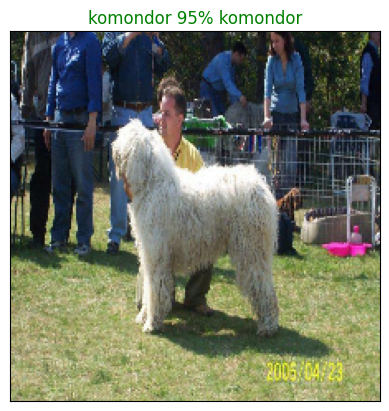

In [63]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=26)

Now we've got one function to visualize our models top prediction, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array, and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [64]:
# Create the function to view our model's top 10 predictions
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [65]:
# Check an example of the top 10 predicted labels
unique_breeds[predictions[9].argsort()[-10:][::-1]]

array(['collie', 'tibetan_mastiff', 'malamute', 'border_collie',
       'groenendael', 'saluki', 'kuvasz', 'bernese_mountain_dog',
       'tibetan_terrier', 'japanese_spaniel'], dtype=object)

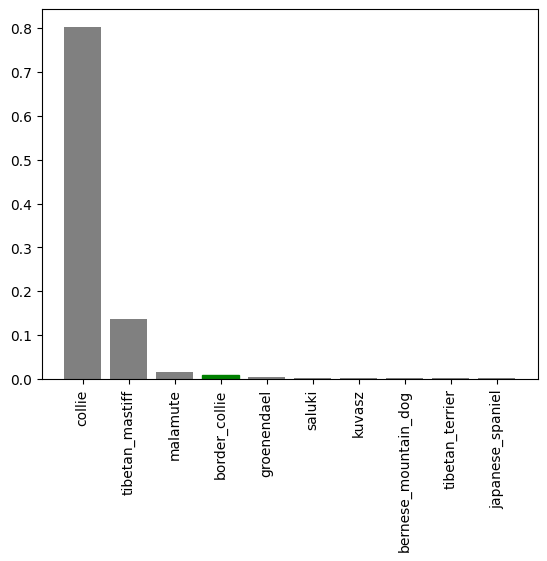

In [66]:
# Make a plot and compare to the previous cell
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

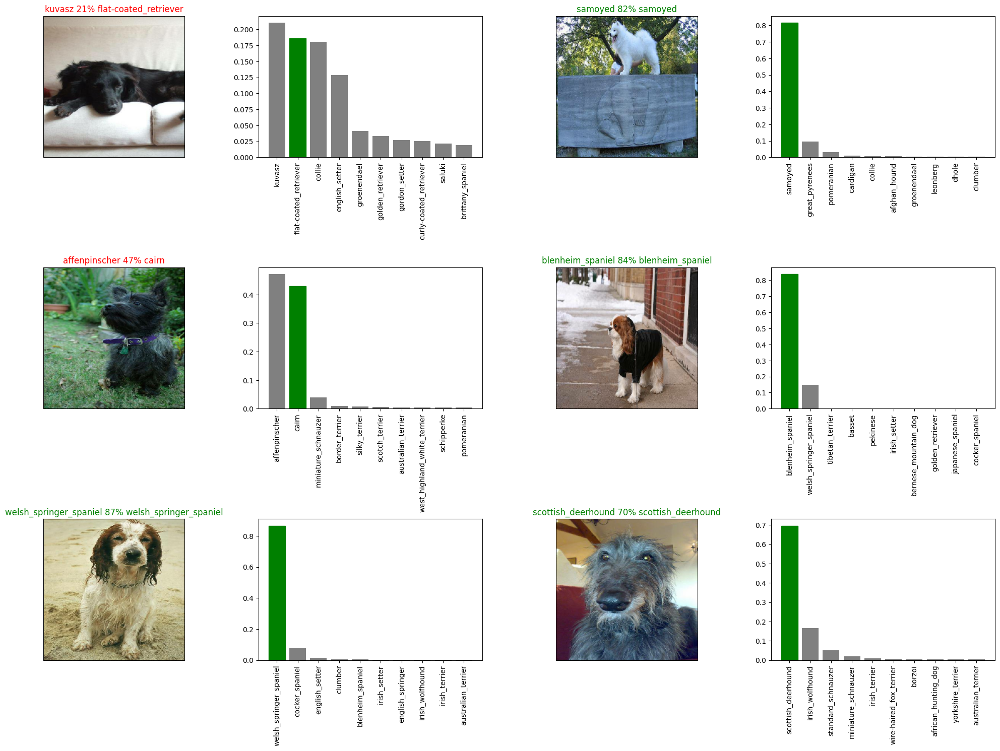

In [67]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving And Reloading A Trained Model

In [68]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [69]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [70]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/dog-breed-identification/models/20241020-22561729464969-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/dog-breed-identification/models/20241020-22561729464969-1000-images-mobilenetv2-Adam.h5'

In [71]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/dog-breed-identification/models/20241020-22561729464969-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/dog-breed-identification/models/20241020-22561729464969-1000-images-mobilenetv2-Adam.h5


In [72]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2717 - accuracy: 0.7000


[1.2717317342758179, 0.699999988079071]

In [73]:
# Evaluate the loaded model (compare to the previous cell)
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2717 - accuracy: 0.7000


[1.2717317342758179, 0.699999988079071]

## Training A Big Dog Model 🐶 (On The Full Data)

In [74]:
# Remind ourselves of the size of our training set
len(X), len(y)

(10222, 10222)

In [75]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [76]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [77]:
# Create a model for full model
full_model = create_model()

Building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [78]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [79]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1478s 5s/step - loss: 1.3409 - accuracy: 0.6679
Epoch 2/100
320/320 [==============================] - 681s 2s/step - loss: 0.4063 - accuracy: 0.8779
Epoch 3/100
320/320 [==============================] - 649s 2s/step - loss: 0.2391 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 666s 2s/step - loss: 0.1552 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 699s 2s/step - loss: 0.1074 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 682s 2s/step - loss: 0.0793 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 670s 2s/step - loss: 0.0587 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 667s 2s/step - loss: 0.0471 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 662s 2s/step - loss: 0.0378 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 689s 2s/step - loss: 0.03

In [80]:
# Save the full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/dog-breed-identification/models/20241021-02501729479028-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/dog-breed-identification/models/20241021-02501729479028-full-image-set-mobilenetv2-Adam.h5'

In [81]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/dog-breed-identification/models/20241021-02501729479028-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/dog-breed-identification/models/20241021-02501729479028-full-image-set-mobilenetv2-Adam.h5


## Making Predictions On The Test Dataset

Since our model has been trained on images in the form of Tensor batches, we'll have to get the test data into the same format to make predictions on it.

Luckily we created `create_data_batches()` earlier which takes a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we will:
* Get the test image filename.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [82]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/dog-breed-identification/test/e8763575a23f1e1a86788b82bd105f07.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e83fec66a32873298df9fa5fdac113aa.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e85b19a69be67eaef9fe58b7e689ee81.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e8914f74848c23b70b520887b3ff2e8a.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e8889cf9d7b2701a85be1c97661b9b26.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/test/e800b6c8d2904e205d67ada800907762.jpg']

In [83]:
len(test_filenames)

10357

In [84]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [85]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about ~1 hour).

In [86]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1107s 3s/step


In [88]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/dog-breed-identification/preds_array.csv", test_predictions, delimiter=",")

In [89]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/dog-breed-identification/preds_array.csv", delimiter=",")

In [90]:
test_predictions[:10]

array([[8.56639537e-10, 5.00263075e-09, 4.12763435e-10, ...,
        1.22692045e-09, 1.07708391e-11, 8.55549231e-09],
       [1.31687217e-10, 1.39224843e-09, 1.27307387e-10, ...,
        1.87419448e-06, 1.16105775e-06, 1.04904480e-07],
       [1.83315763e-08, 8.57665938e-09, 2.83206059e-09, ...,
        1.50148921e-07, 5.25195958e-07, 1.20518673e-09],
       ...,
       [2.34673738e-08, 7.98385025e-10, 7.84839127e-09, ...,
        7.34556593e-09, 4.74575756e-09, 2.64610645e-09],
       [1.31709532e-10, 2.52460973e-06, 1.92201768e-10, ...,
        1.38595104e-04, 5.71599301e-08, 1.78155046e-10],
       [5.93671501e-11, 1.20927036e-11, 3.76140097e-09, ...,
        3.58062272e-04, 6.39141263e-07, 5.24191888e-12]])

In [91]:
test_predictions.shape

(10357, 120)

## Preparing Test Dataset Predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as CSV to submit it to Kaggle.

In [92]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [94]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8763575a23f1e1a86788b82bd105f07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e83f4c0ff6dec86d89d0f8b70ecd3cea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e83fec66a32873298df9fa5fdac113aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e85b19a69be67eaef9fe58b7e689ee81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7b4b0e7d7d76f8dbd64920f34443b25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8763575a23f1e1a86788b82bd105f07,8.566395e-10,5.002631e-09,4.127634e-10,4.646626e-10,8.920773e-09,5.410510e-11,2.279667e-13,4.123839e-11,1.925193e-07,...,1.789749e-08,1.782945e-11,2.091369e-13,1.379630e-12,1.030440e-10,9.064438e-12,1.262989e-11,1.226920e-09,1.077084e-11,8.555492e-09
1,e83f4c0ff6dec86d89d0f8b70ecd3cea,1.316872e-10,1.392248e-09,1.273074e-10,8.753636e-08,1.116942e-05,4.402445e-06,1.823495e-06,3.402295e-05,3.095702e-10,...,2.951380e-08,2.186053e-07,3.417148e-09,9.600851e-08,4.077866e-09,5.097007e-05,4.702663e-09,1.874194e-06,1.161058e-06,1.049045e-07
2,e83fec66a32873298df9fa5fdac113aa,1.833158e-08,8.576659e-09,2.832061e-09,6.879630e-12,2.518788e-11,6.799166e-09,3.220893e-10,9.995170e-12,7.645050e-12,...,5.006696e-11,5.963126e-10,7.660399e-10,8.955589e-10,6.977261e-08,1.392881e-12,2.547673e-10,1.501489e-07,5.251960e-07,1.205187e-09
3,e85b19a69be67eaef9fe58b7e689ee81,1.017571e-07,2.770093e-05,6.135418e-07,2.243434e-06,1.533604e-06,6.899350e-08,7.176843e-01,1.671258e-05,1.160958e-07,...,1.041318e-05,1.448979e-06,2.112416e-05,1.861531e-08,3.000359e-07,4.303736e-06,4.002169e-06,3.943282e-08,1.547673e-05,3.913756e-02
4,e7b4b0e7d7d76f8dbd64920f34443b25,6.417535e-10,6.253576e-10,2.702503e-08,4.129148e-07,5.452184e-04,2.234465e-09,3.498632e-09,1.621456e-10,2.482854e-07,...,8.425496e-10,2.768311e-09,6.133783e-01,1.298364e-03,1.154780e-01,1.726973e-10,2.900145e-10,1.474492e-07,6.526877e-06,6.350874e-08


In [96]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/dog-breed-identification/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Make Predictions On Custom Images

To make predictions on custom images, we will:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. Since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [97]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [98]:
# Check our file paths
custom_image_paths

['drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/dog-photo-2.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/dog-photo-1.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/dog-photo-5.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/dog-photo-3.jpg',
 'drive/My Drive/Dog Vision/dog-breed-identification/my-dogs/dog-photo-4.jpg']

In [99]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [100]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [101]:
# Check the shape of our predictions
custom_preds.shape

(5, 120)

In [102]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever',
 'blenheim_spaniel',
 'samoyed',
 'pembroke',
 'bernese_mountain_dog']

In [103]:
# Get custom images (our unbatchify() function won't work since there aren't labels, maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

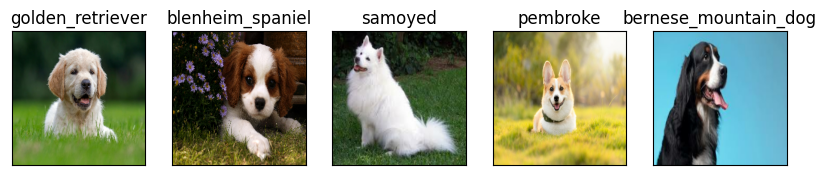

In [105]:
# Check custom image predictions
plt.figure(figsize=(10, 10))

for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)